In [1]:
import numpy
import tensorboard as tensorboard
import seaborn as seaborn
from tensorflow.python.client import device_lib
import tensorflow as tf
config = tf.compat.v1.ConfigProto(gpu_options = 
                         tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.2)
# device_count = {'GPU': 1}
)
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)
import os
import pandas as pd
import shap
import random
import numpy as np
import seaborn as sns
import csv
from skimage.util import random_noise
import time
import lime
from lime import lime_image
import sys
from skimage.segmentation import slic
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
from matplotlib.image import imread
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import kr_helper_funcs as kr
print('tensorflow' + tf.__version__)
print('tensorboard' + tensorboard.__version__)
print('seaborn' + seaborn.__version__)
tf.config.list_physical_devices('GPU')
print(tf.test.is_built_with_cuda)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
tf.config.experimental.list_physical_devices('GPU')
device_lib.list_local_devices()
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

tensorflow2.2.0
tensorboard2.2.2
seaborn0.10.1
<function is_built_with_cuda at 0x000002E6FE3165E0>
Num GPUs Available:  1


In [37]:
save_path = os.path.join('C:/Users/dan39/OneDrive/Desktop/DissertationLatex/DissertationLatex/images/flowers')
                         
def save(img_name):
    plt.savefig(os.path.join(save_path, img_name))

In [2]:
data_dir="../../input/kaggle-flowers"
test_path= os.path.join(data_dir, 'test')

os.listdir(test_path)

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [3]:
image_shape =(250, 250, 3)
test_gen = ImageDataGenerator(rescale =1./255)
batch_size=32
test_image_gen= test_gen.flow_from_directory(test_path, target_size=image_shape[:2], 
                                               color_mode='rgb', batch_size=batch_size, 
                                               class_mode='categorical',  shuffle=False)
test_image_gen.class_indices

Found 750 images belonging to 5 classes.


{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

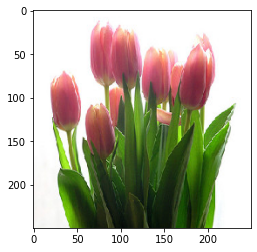

In [4]:
import shap
import numpy as np
X_test, _ = test_image_gen.next()
# background = X_test[np.random.choice(20, 10, replace=False)]
background = X_test[0:5]
# explain predictions of the model on three images
# e = shap.DeepExplainer(tf.keras.models.load_model('flowers'), background)

model =tf.keras.models.load_model('flowers-resnet')
# tulip_image_path = test_path + '/tulip/' + os.listdir(test_path + '/tulip/')[5]
tulip_image_path = test_path + '/tulip/' + os.listdir(test_path + '/tulip/')[5]
# plt.imshow(imread(dog_image))
img = image.load_img(tulip_image_path, target_size=(250, 250, 3))
# plt.imshow(imread(tulip_image_path))
img_orig = image.img_to_array(img)
standardized_image = test_gen.standardize(img_orig)
plt.imshow((standardized_image))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
[1.13701331615448, 0.6926897764205933, 0.5795247554779053, 0.5353732109069824, 0.4985238909721375, 0.4669910371303558, 0.42410871386528015, 0.3975605070590973, 0.3834193050861359, 0.3610800802707672, 0.3255809247493744, 0.3369177877902985, 0.3418700098991394]


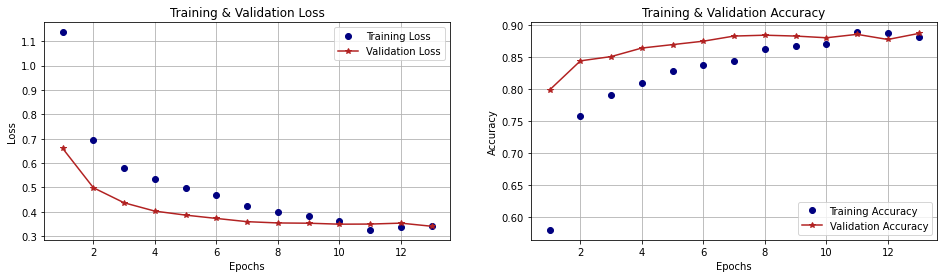

In [34]:
history = pd.read_csv('history_flowers-resnet.csv')
history_dict = history.to_dict('list')
ax = kr.show_plots(history_dict)

In [36]:
from sklearn.metrics import classification_report, confusion_matrix
pred = model.predict_classes(test_image_gen)
print (classification_report(test_image_gen.classes, pred))

              precision    recall  f1-score   support

           0       0.91      0.87      0.89       150
           1       0.94      0.86      0.90       150
           2       0.88      0.89      0.88       150
           3       0.89      0.90      0.90       150
           4       0.83      0.91      0.87       150

    accuracy                           0.89       750
   macro avg       0.89      0.89      0.89       750
weighted avg       0.89      0.89      0.89       750



In [5]:
os.listdir(test_path + '/sunflower/')

['1008566138_6927679c8a.jpg',
 '1022552002_2b93faf9e7_n.jpg',
 '1022552036_67d33d5bd8_n.jpg',
 '1043442695_4556c4c13d_n.jpg',
 '1044296388_912143e1d4.jpg',
 '1064662314_c5a7891b9f_m.jpg',
 '1217254584_4b3028b93d.jpg',
 '1240624822_4111dde542.jpg',
 '1240625276_fb3bd0c7b1.jpg',
 '1240626292_52cd5d7fb1_m.jpg',
 '1244774242_25a20d99a9.jpg',
 '1267876087_a1b3c63dc9.jpg',
 '127192624_afa3d9cb84.jpg',
 '1297092593_e573c0a3d6.jpg',
 '1314584013_fe935fdeb1_n.jpg',
 '1379256773_bb2eb0d95b_n.jpg',
 '1419608016_707b887337_n.jpg',
 '145303599_2627e23815_n.jpg',
 '147804446_ef9244c8ce_m.jpg',
 '1484598527_579a272f53.jpg',
 '1485456230_58d8e45e88.jpg',
 '151898652_b5f1c70b98_n.jpg',
 '1596293240_2d5b53495a_m.jpg',
 '164668737_aeab0cb55e_n.jpg',
 '164670176_9f5b9c7965.jpg',
 '164670455_29d8e02bbd_n.jpg',
 '164671753_ab36d9cbb7_n.jpg',
 '164672339_f2b5b164f6.jpg',
 '1715303025_e7065327e2.jpg',
 '175638423_058c07afb9.jpg',
 '1788133737_b1133d1aa7.jpg',
 '184682095_46f8607278.jpg',
 '184682320_73ccf74710.jpg',
 '184682506_8a9b8c662d.jpg',
 '184682652_c927a49226_m.jpg',
 '184682920_97ae41ce60_m.jpg',
 '184683023_737fec5b18.jpg',
 '1880606744_23e3dc4f6b_n.jpg',
 '193874852_fb633d8d00_n.jpg',
 '193878348_43571127b9_n.jpg',
 '197011740_21825de2bf.jpg',
 '200011914_93f57ed68b.jpg',
 '200288046_0032f322ff_n.jpg',
 '200557977_bf24d9550b.jpg',
 '200557979_a16112aac1_n.jpg',
 '200557981_f800fa1af9.jpg',
 '200557983_10a88672fc.jpg',
 '201809908_0ef84bb351.jpg',
 '2067882323_8de6623ffd.jpg',
 '210076535_80951bc5d5.jpg',
 '215798352_184d8040d1.jpg',
 '215798354_429de28c2d.jpg',
 '215798357_3f4bfa27b7.jpg',
 '2307673262_e1e1aefd29.jpg',
 '2328600790_90e2942557_n.jpg',
 '235651658_a7b3e7cbdd.jpg',
 '2425164088_4a5d2cdf21_n.jpg',
 '244074259_47ce6d3ef9.jpg',
 '2442985637_8748180f69.jpg',
 '2443095419_17b920d155_m.jpg',
 '2443921986_d4582c123a.jpg',
 '24459548_27a783feda.jpg',
 '24459750_eb49f6e4cb_m.jpg',
 '253586685_ee5b5f5232.jpg',
 '2575272111_f04d79b9af_n.jpg',
 '2588234269_c4bfd0d8b9_n.jpg',
 '2588453601_66f2a03cca_n.jpg',
 '2598973480_07de93e91d_n.jpg',
 '2619000556_6634478e64_n.jpg',
 '26254755_1bfc494ef1_n.jpg',
 '265422922_bbbde781d2_m.jpg',
 '265450085_6e9f276e2e.jpg',
 '2678588376_6ca64a4a54_n.jpg',
 '2689228449_e0be72cf00_n.jpg',
 '2694860538_b95d60122c_m.jpg',
 '2697194548_ec8f8de97c_n.jpg',
 '2706304885_4916102704_n.jpg',
 '2706736074_b0fba20b3e.jpg',
 '2720698862_486d3ec079_m.jpg',
 '2721638730_34a9b7a78b.jpg',
 '2723995667_31f32294b4.jpg',
 '2729206569_9dd2b5a3ed.jpg',
 '2733109082_1351f6738a_n.jpg',
 '27465811_9477c9d044.jpg',
 '27466794_57e4fe5656.jpg',
 '274846229_990e976683_n.jpg',
 '274848710_5185cf33b1_n.jpg',
 '2759796022_55bd47bfa2_n.jpg',
 '2767658405_1e2043f44c_n.jpg',
 '2767688889_b176b0c3fb.jpg',
 '2803725948_5fd1f2fc99_n.jpg',
 '2807106374_f422b5f00c.jpg',
 '2816256710_a2d3616fae.jpg',
 '2816503473_580306e772.jpg',
 '2823659190_afdabee45c.jpg',
 '287233531_74d4605814_m.jpg',
 '2883115609_5a69357b5d_m.jpg',
 '2883115621_4837267ea1_m.jpg',
 '2894191705_a1d2d80c80.jpg',
 '2895404754_6d9f9416d7_n.jpg',
 '2927020075_54c9186797_n.jpg',
 '2940221732_3507f3e927_n.jpg',
 '2944298800_1984bd4f8a_m.jpg',
 '2949654221_909b0c86a1_n.jpg',
 '2950505226_529e013bf7_m.jpg',
 '2960610406_b61930727f_n.jpg',
 '2979133707_84aab35b5d.jpg',
 '2979297519_17a08b37f6_m.jpg',
 '2980154410_bffd7a3452_n.jpg',
 '2996573407_5e473b9359.jpg',
 '29972905_4cc537ff4b_n.jpg',
 '3001531316_efae24d37d_n.jpg',
 '3001533700_1c62fb8b4a_n.jpg',
 '3001536784_3bfd101b23_n.jpg',
 '3062794421_295f8c2c4e.jpg',
 '310380634_60e6c79989.jpg',
 '3146795631_d062f233c1.jpg',
 '3154932076_eff5c38231_n.jpg',
 '3154932290_4bf43bd34f_n.jpg',
 '3196753837_411b03682d_n.jpg',
 '3311874685_7b9ef10f7e_m.jpg',
 '3334350831_f8755a2095_n.jpg',
 '3466923719_b4b6df7f8b_n.jpg',
 '3514340206_efb8198a80_n.jpg',
 '35477171_13cb52115c_n.jpg',
 '3568114325_d6b1363497.jpg',
 '3568925290_faf7aec3a0.jpg',
 '3575811488_a31714472a.jpg',
 '3594967811_697184b026_n.jpg',
 '3596902268_049e33a2cb_n.jpg',
 '39271782_

In [6]:
# segment the image so we don't have to explain every pixel
segments_slic = slic(img, n_segments=49, compactness=30, sigma=3)

# define a function that depends on a binary mask representing if an image region is hidden
def mask_image(zs, segmentation, image, background=None):
    print((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
    if background is None:
        background = image.mean((0,1))
    out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
    for i in range(zs.shape[0]):
        out[i,:,:,:] = image
        for j in range(zs.shape[1]):
            if zs[i,j] == 0:
                out[i][segmentation == j,:] = background
    return out
def f(z):
#     print("Call")
#     for i in z:
#         print (i)
#     print(img_orig.shape)
    return model.predict(mask_image(z, segments_slic, img_orig, 250))

skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.


In [7]:
# use Kernel SHAP to explain the network's predictions
explainer = shap.KernelExplainer(f, np.zeros((1,50)))
shap_values = explainer.shap_values(np.ones((1,50)) , nsamples=1000) # runs VGG16 1000 times

(1, 250, 250, 3)


(1, 250, 250, 3)
(1000, 250, 250, 3)



l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!


In [8]:
list(test_image_gen.class_indices.keys())

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [9]:
# get the top predictions from the model
preds = model.predict(np.expand_dims(img_orig.copy(), axis=0))
top_preds = np.argsort(-preds)

In [10]:
 model.predict(np.expand_dims(img_orig.copy(), axis=0))

array([[1.9459480e-04, 5.5166436e-07, 3.6937872e-05, 3.0578140e-04,
        9.9946219e-01]], dtype=float32)

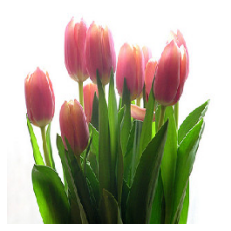

<Figure size 432x288 with 0 Axes>

In [49]:
plt.imshow(img_orig.copy())
plt.axis('off')
plt.margins(0,0)
# cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
# cb.outline.set_visible(False)
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())
plt.show()
save("original")

In [12]:
# make a color map
from matplotlib.colors import LinearSegmentedColormap
colors = []
for l in np.linspace(1,0,100):
    colors.append((245/255,39/255,87/255,l))
for l in np.linspace(0,1,100):
    colors.append((24/255,196/255,93/255,l))
cm = LinearSegmentedColormap.from_list("shap", colors)

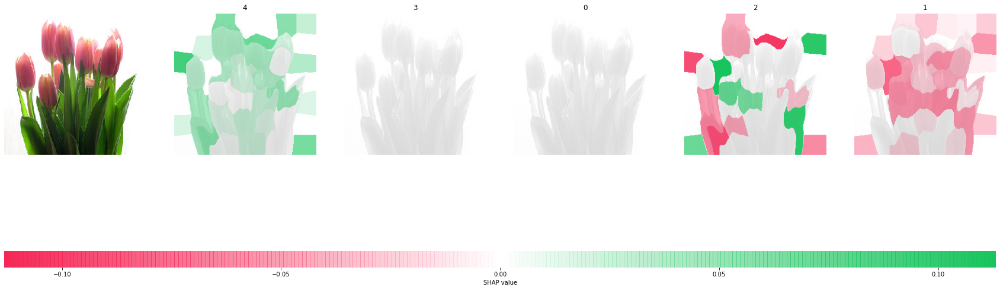

In [13]:
def fill_segmentation(values, segmentation):
    out = np.zeros(segmentation.shape)
    for i in range(len(values)):
        out[segmentation == i] = values[i]
    return out

# plot our explanations
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30,20))
inds = top_preds[0]
axes[0].imshow(img)
axes[0].axis('off')
max_val = np.max([np.max(np.abs(shap_values[i][:,:-1])) for i in range(len(shap_values))])
for i in range(5):
    m = fill_segmentation(shap_values[inds[i]][0], segments_slic)
    axes[i+1].set_title(str(inds[i]))
    axes[i+1].imshow(img.convert('LA'), alpha=0.15)
    im = axes[i+1].imshow(m, cmap=cm, vmin=-max_val, vmax=max_val)
    axes[i+1].axis('off')
cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
cb.outline.set_visible(False)
plt.show()

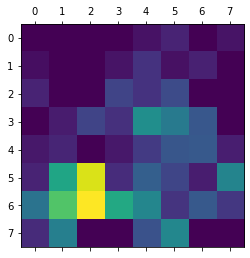

16


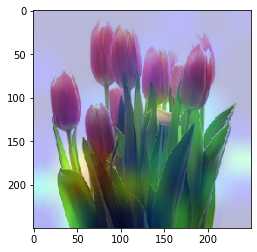

In [46]:
import grad_cam as grad
grad.test_drive_grad_original(img_orig)

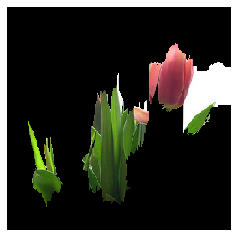

<Figure size 432x288 with 0 Axes>

In [42]:
# explainer = lime_image.LimeImageExplainer()
# explanation = explainer.explain_instance(img_orig.astype("double"), model.predict, num_samples = 1000)

lime_img, _ = explanation.get_image_and_mask(explanation.top_labels[0] , positive_only=True, negative_only=False, hide_rest=True, num_features = 5, min_weight=0)


plt.matshow(lime_img)
plt.axis('off')
plt.margins(0,0)
# cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
# cb.outline.set_visible(False)
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())
plt.show()
save("lime")

In [14]:
list(test_image_gen.class_indices.keys())

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!


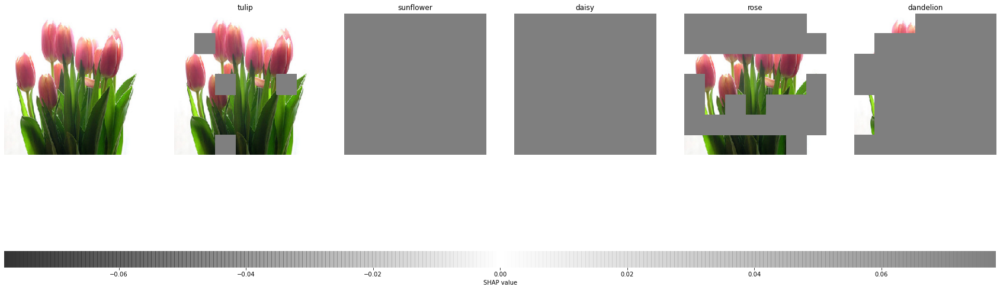

In [15]:
def extract_top_ten(shap_values, num_features=10):
    new_shap_values=[]
    for values in shap_values:
        shap_list = list(set([item for sublist in values for item in sublist]))
        shap_list.sort(reverse=True)
        shap_list = shap_list[:num_features]
        new_values = [numpy.asarray([a if a in shap_list else 0 for a in l]) for l in values] # filter out negative values and keep top 10
        new_shap_values.append(new_values)
    shap_values = numpy.asarray(new_shap_values)
    return shap_values
    
def show_cut_image(shap_values, img_orig, num_features=1000):
# segment the image so we don't have to explain every pixel
    segments_slic = slic(img_orig, n_segments=49, compactness=1000, sigma=3)

    # define a function that depends on a binary mask representing if an image region is hidden
    def mask_image(zs, segmentation, image, background=None):
        if background is None:
            background = image.mean((0,1))
        out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
        for i in range(zs.shape[0]):
            out[i,:,:,:] = image
            for j in range(zs.shape[1]):
                if zs[i,j] == 0:
                    out[i][segmentation == j,:] = background
        return out
    def f(z):
#         for img in mask_image(z, segments_slic, img_orig, 250):
#             plt.imshow(img)
#             plt.show()
#         print(model.predict(mask_image(z, segments_slic, img_orig, 250)))
        return model.predict((mask_image(z, segments_slic, img_orig, 250)))

    # # use Kernel SHAP to explain the network's predictions
    explainer = shap.KernelExplainer(f, np.zeros((1,50)))
    shap_values = explainer.shap_values(np.ones((1,50)), nsamples=5000) # runs model 1000 times

    shap_values = extract_top_ten(shap_values, num_features)

    # get the top predictions from the model
    preds = model.predict((np.expand_dims(img_orig.copy(), axis=0)))
    top_preds = np.argsort(-preds)

    # make a color map
    from matplotlib.colors import LinearSegmentedColormap
    colors = []
    for l in np.linspace(1,0,100):
        colors.append((0.2,0.2,0.2,l))
    for l in np.linspace(0,1,100):
        colors.append((0.5,0.5,0.5,l))
    cm = LinearSegmentedColormap.from_list("shap", colors)

    def fill_segmentation(values, segmentation):
        out = np.zeros(segmentation.shape)
        for i in range(len(values)):
            out[segmentation == i] = 0 if values[i]> 0 else 1
        return out

    # plot our explanations
    fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30,20))
    inds = top_preds[0]
    axes[0].imshow(img_orig)
    axes[0].axis('off')
    max_val = np.max([np.max(np.abs(shap_values[i][:,:-1])) for i in range(len(shap_values))])
    for i in range(5):
        m = fill_segmentation(shap_values[inds[i]][0], segments_slic)
        axes[i+1].set_title(str(list(test_image_gen.class_indices.keys())[inds[i]]))
        axes[i+1].imshow(img_orig)
        im = axes[i+1].imshow(m, cmap=cm, vmin=-max_val, vmax=max_val)
        plt.savefig('foo.png')
        axes[i+1].axis('off')
    cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
    cb.outline.set_visible(False)
    plt.show()
    
show_cut_image(shap_values, img_orig)

In [16]:
np.argsort(-preds)

array([[4, 3, 0, 2, 1]], dtype=int64)

In [22]:

from importlib import reload

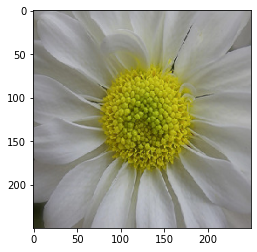

Explainer name: grad Image number: 1 num_features 1 batch 0 number 0 strategy top


skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.


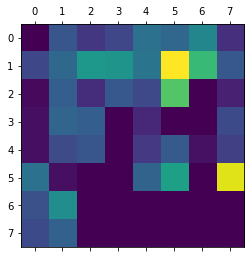

16


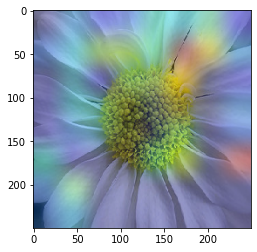

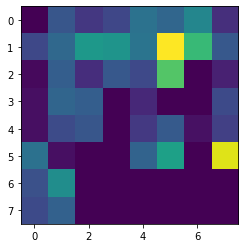

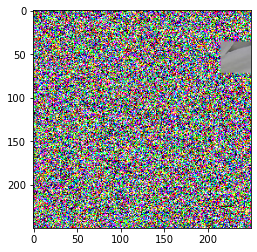

Original Class: 0 original confidence:0.9882285594940186 new class top:0 new confidence top: 0.7678813934326172 
Explainer name: grad Image number: 1 num_features 1 batch 0 number 0 strategy rest
Hitting cache, returning prev values


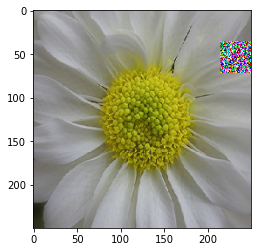

Original Class: 0 original confidence:0.9882285594940186 new class top:0 new confidence rest: 0.9822887182235718 


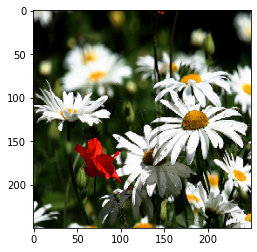

Explainer name: grad Image number: 2 num_features 1 batch 0 number 1 strategy top


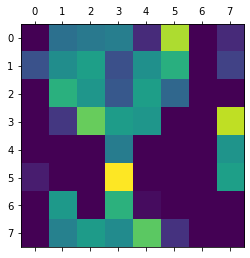

16


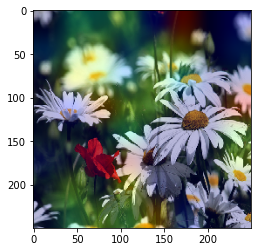

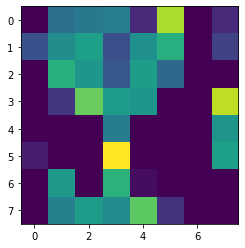

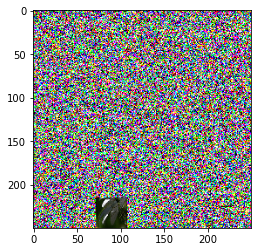

Original Class: 0 original confidence:0.9894258975982666 new class top:0 new confidence top: 0.620114803314209 
Explainer name: grad Image number: 2 num_features 1 batch 0 number 1 strategy rest
Hitting cache, returning prev values


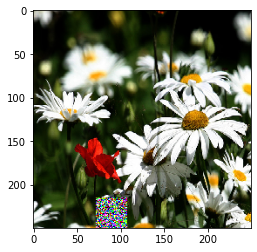

Original Class: 0 original confidence:0.9894258975982666 new class top:0 new confidence rest: 0.9876699447631836 


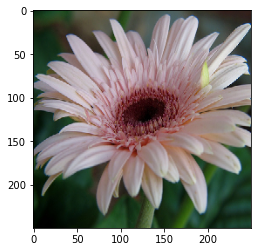

Explainer name: grad Image number: 3 num_features 1 batch 0 number 2 strategy top


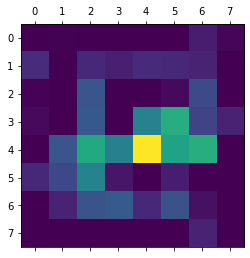

16


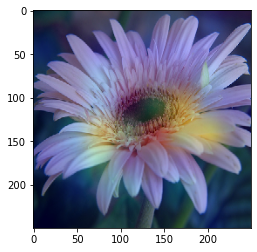

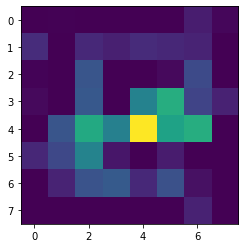

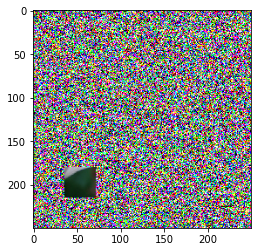

Original Class: 0 original confidence:0.988477885723114 new class top:1 new confidence top: 0.23985077440738678 
Explainer name: grad Image number: 3 num_features 1 batch 0 number 2 strategy rest
Hitting cache, returning prev values


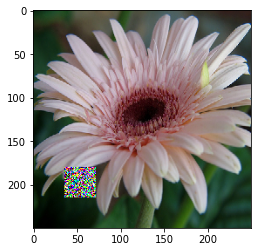

Original Class: 0 original confidence:0.988477885723114 new class top:0 new confidence rest: 0.9897622466087341 


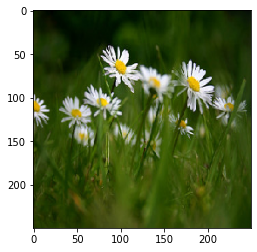

Explainer name: grad Image number: 4 num_features 1 batch 0 number 3 strategy top


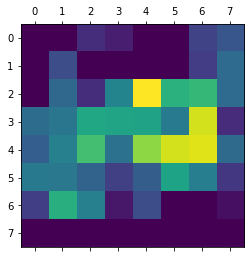

16


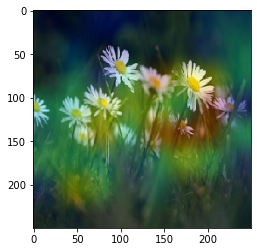

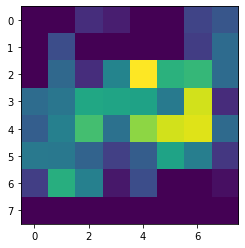

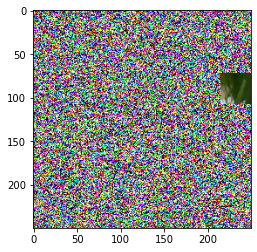

Original Class: 0 original confidence:0.9991875290870667 new class top:0 new confidence top: 0.7293741703033447 
Explainer name: grad Image number: 4 num_features 1 batch 0 number 3 strategy rest
Hitting cache, returning prev values


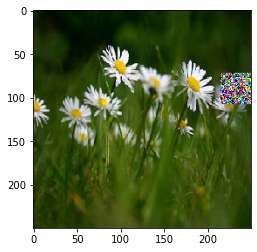

Original Class: 0 original confidence:0.9991875290870667 new class top:0 new confidence rest: 0.9983697533607483 


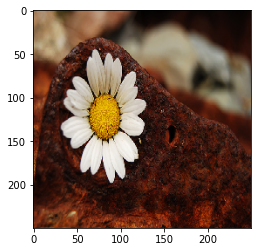

Explainer name: grad Image number: 6 num_features 1 batch 0 number 5 strategy top


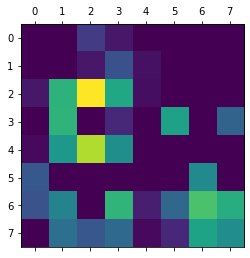

16


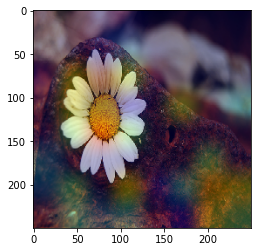

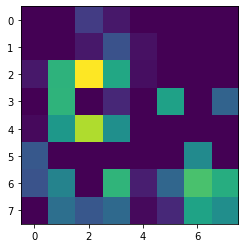

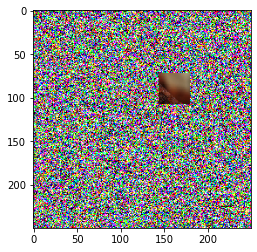

Original Class: 0 original confidence:0.999966025352478 new class top:3 new confidence top: 0.29382529854774475 
Explainer name: grad Image number: 6 num_features 1 batch 0 number 5 strategy rest
Hitting cache, returning prev values


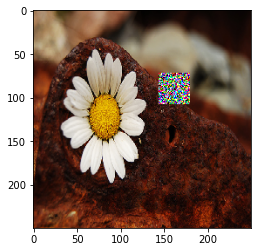

Original Class: 0 original confidence:0.999966025352478 new class top:0 new confidence rest: 0.9996459484100342 


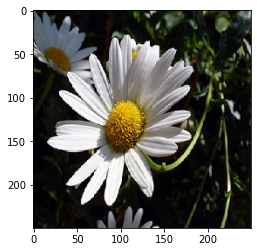

Explainer name: grad Image number: 7 num_features 1 batch 0 number 6 strategy top


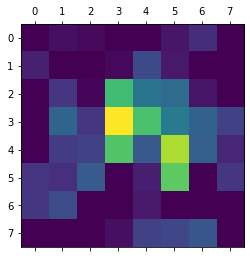

16


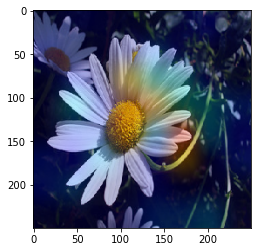

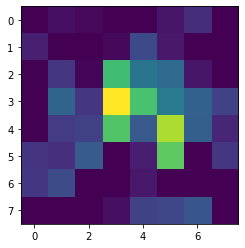

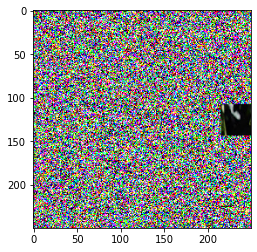

Original Class: 0 original confidence:0.9995537400245667 new class top:0 new confidence top: 0.44570550322532654 
Explainer name: grad Image number: 7 num_features 1 batch 0 number 6 strategy rest
Hitting cache, returning prev values


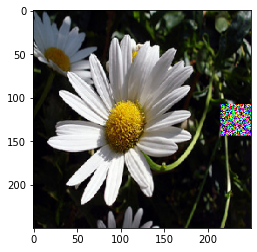

Original Class: 0 original confidence:0.9995537400245667 new class top:0 new confidence rest: 0.99936443567276 


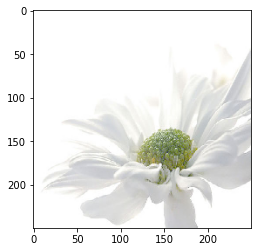

Explainer name: grad Image number: 8 num_features 1 batch 0 number 7 strategy top


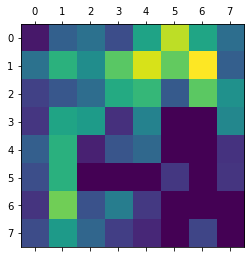

16


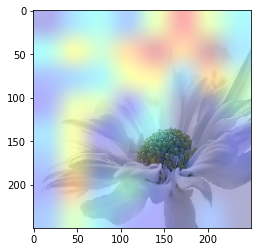

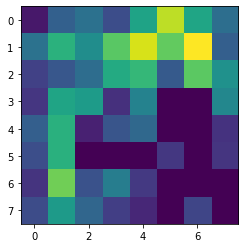

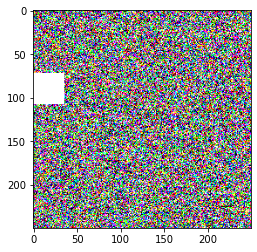

Original Class: 0 original confidence:0.9910964965820312 new class top:0 new confidence top: 0.9379412531852722 
Explainer name: grad Image number: 8 num_features 1 batch 0 number 7 strategy rest
Hitting cache, returning prev values


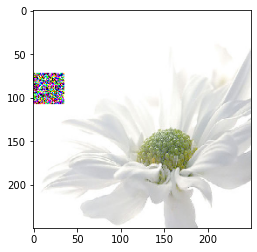

Original Class: 0 original confidence:0.9910964965820312 new class top:0 new confidence rest: 0.984594464302063 


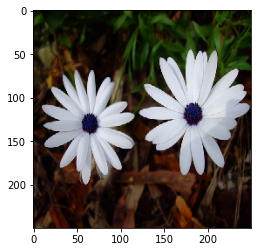

Explainer name: grad Image number: 9 num_features 1 batch 0 number 8 strategy top


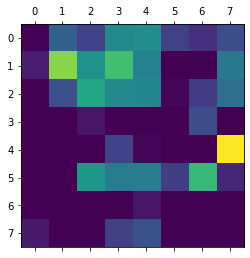

16


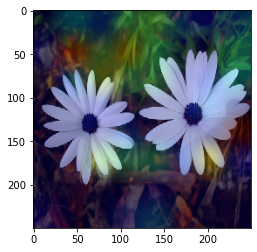

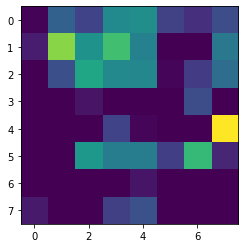

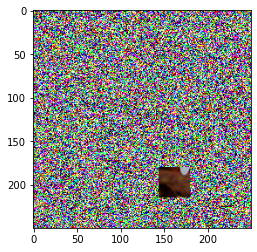

Original Class: 0 original confidence:0.9951981902122498 new class top:3 new confidence top: 0.20939680933952332 
Explainer name: grad Image number: 9 num_features 1 batch 0 number 8 strategy rest
Hitting cache, returning prev values


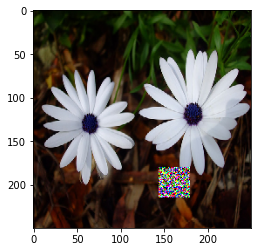

Original Class: 0 original confidence:0.9951981902122498 new class top:0 new confidence rest: 0.997991681098938 


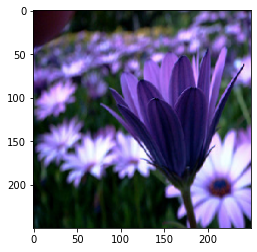

Explainer name: grad Image number: 10 num_features 1 batch 0 number 9 strategy top


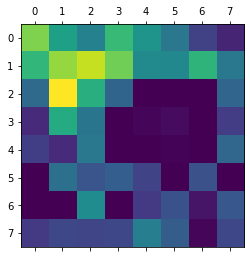

16


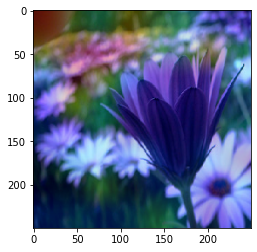

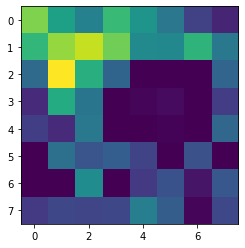

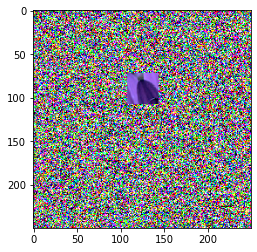

Original Class: 0 original confidence:0.9598047137260437 new class top:1 new confidence top: 0.2654919922351837 
Explainer name: grad Image number: 10 num_features 1 batch 0 number 9 strategy rest
Hitting cache, returning prev values


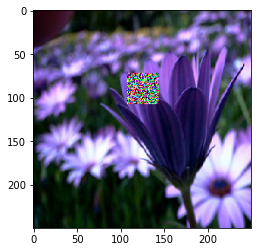

Original Class: 0 original confidence:0.9598047137260437 new class top:0 new confidence rest: 0.9804971218109131 


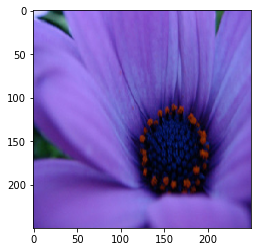

Explainer name: grad Image number: 11 num_features 1 batch 0 number 10 strategy top


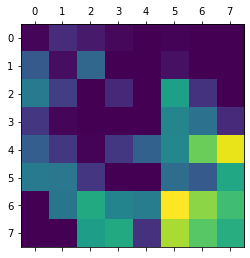

16


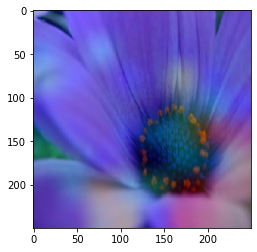

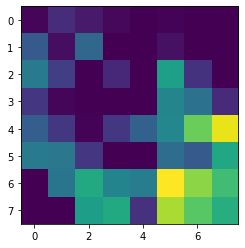

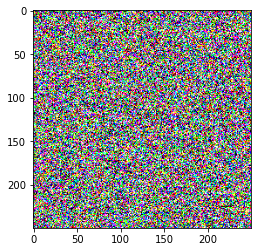

Original Class: 0 original confidence:0.9802589416503906 new class top:0 new confidence top: 0.7123033404350281 
Explainer name: grad Image number: 11 num_features 1 batch 0 number 10 strategy rest
Hitting cache, returning prev values


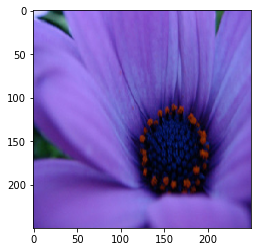

Original Class: 0 original confidence:0.9802589416503906 new class top:0 new confidence rest: 0.9802589416503906 


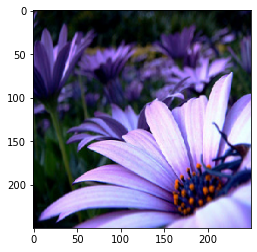

Explainer name: grad Image number: 12 num_features 1 batch 0 number 11 strategy top


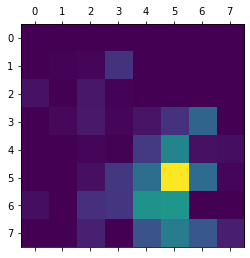

16


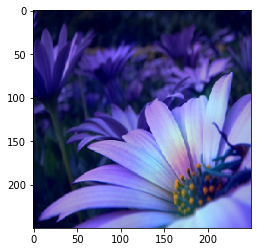

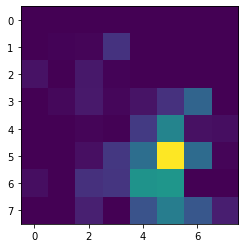

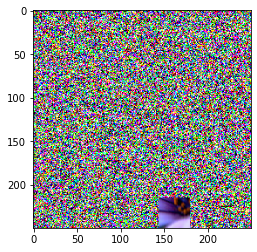

Original Class: 0 original confidence:0.9627159237861633 new class top:0 new confidence top: 0.6919489502906799 
Explainer name: grad Image number: 12 num_features 1 batch 0 number 11 strategy rest
Hitting cache, returning prev values


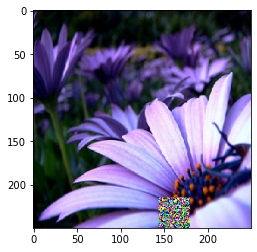

Original Class: 0 original confidence:0.9627159237861633 new class top:0 new confidence rest: 0.9527290463447571 


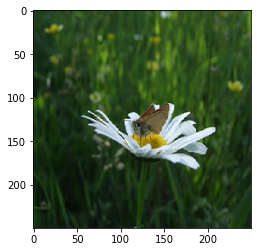

Explainer name: grad Image number: 13 num_features 1 batch 0 number 12 strategy top


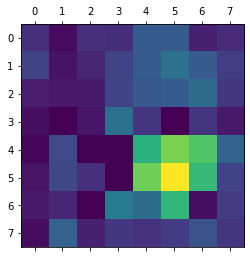

16


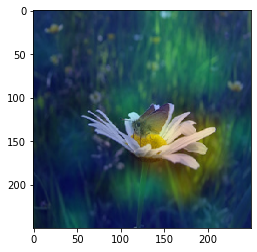

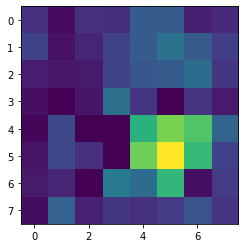

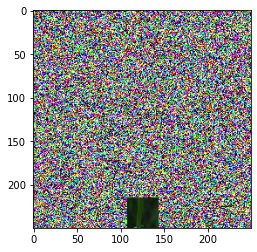

Original Class: 0 original confidence:0.998551070690155 new class top:0 new confidence top: 0.7670420408248901 
Explainer name: grad Image number: 13 num_features 1 batch 0 number 12 strategy rest
Hitting cache, returning prev values


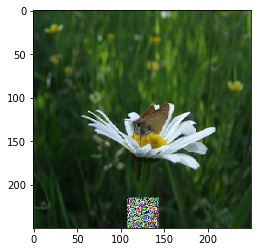

Original Class: 0 original confidence:0.998551070690155 new class top:0 new confidence rest: 0.9979279041290283 


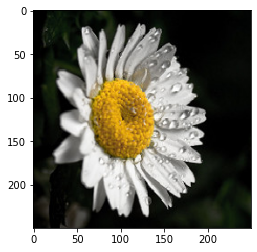

Explainer name: grad Image number: 14 num_features 1 batch 0 number 13 strategy top


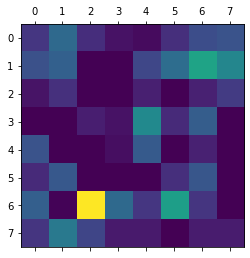

16


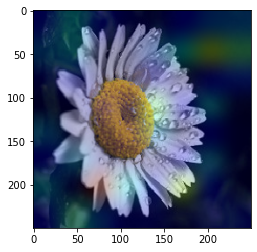

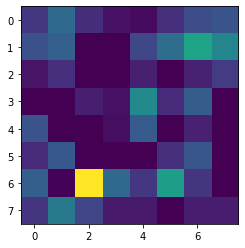

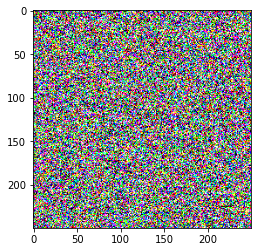

Original Class: 0 original confidence:0.9974091649055481 new class top:0 new confidence top: 0.7123033404350281 
Explainer name: grad Image number: 14 num_features 1 batch 0 number 13 strategy rest
Hitting cache, returning prev values


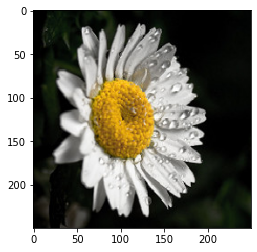

Original Class: 0 original confidence:0.9974091649055481 new class top:0 new confidence rest: 0.9974091649055481 


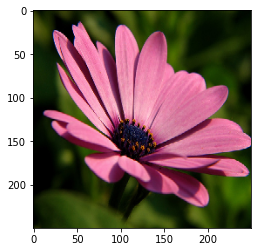

Explainer name: grad Image number: 15 num_features 1 batch 0 number 14 strategy top


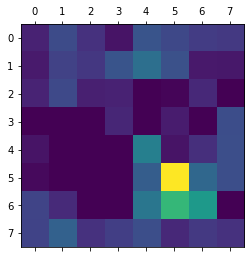

16


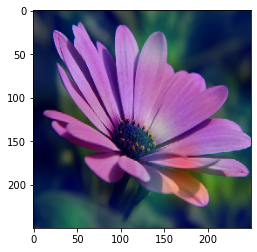

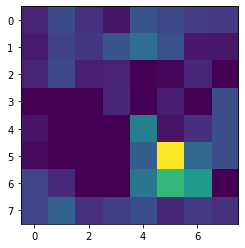

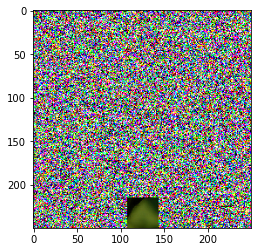

Original Class: 0 original confidence:0.9617679119110107 new class top:0 new confidence top: 0.6466740965843201 
Explainer name: grad Image number: 15 num_features 1 batch 0 number 14 strategy rest
Hitting cache, returning prev values


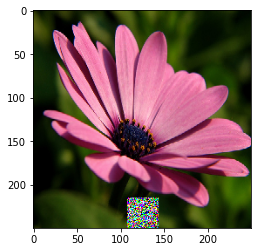

Original Class: 0 original confidence:0.9617679119110107 new class top:0 new confidence rest: 0.8811144828796387 


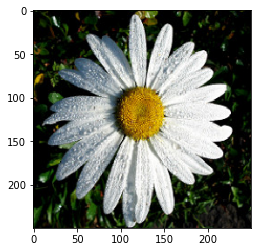

Explainer name: grad Image number: 16 num_features 1 batch 0 number 15 strategy top


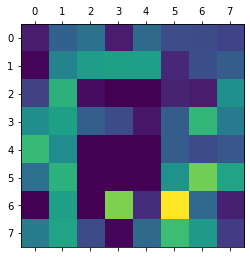

16


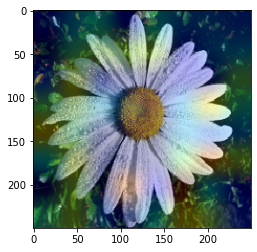

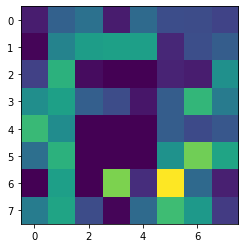

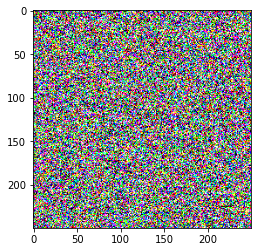

Original Class: 0 original confidence:0.9974119067192078 new class top:0 new confidence top: 0.7123033404350281 
Explainer name: grad Image number: 16 num_features 1 batch 0 number 15 strategy rest
Hitting cache, returning prev values


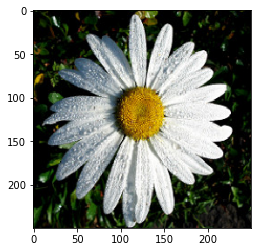

Original Class: 0 original confidence:0.9974119067192078 new class top:0 new confidence rest: 0.9974119067192078 


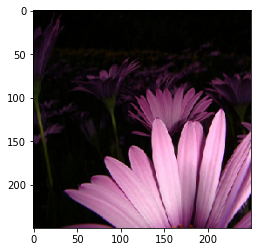

Explainer name: grad Image number: 17 num_features 1 batch 0 number 16 strategy top


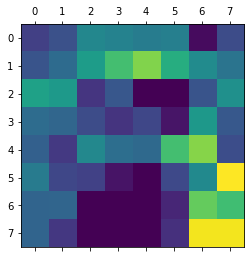

16


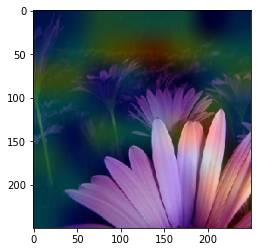

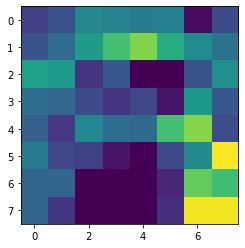

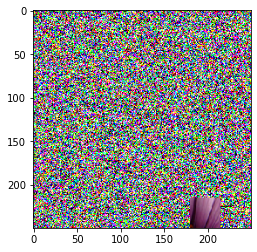

Original Class: 0 original confidence:0.8754684925079346 new class top:0 new confidence top: 0.6747217178344727 
Explainer name: grad Image number: 17 num_features 1 batch 0 number 16 strategy rest
Hitting cache, returning prev values


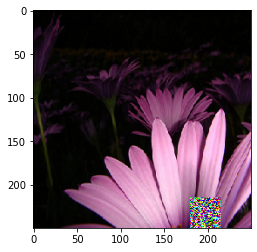

Original Class: 0 original confidence:0.8754684925079346 new class top:0 new confidence rest: 0.8934378623962402 


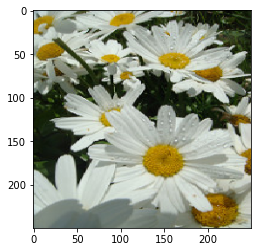

Explainer name: grad Image number: 18 num_features 1 batch 0 number 17 strategy top


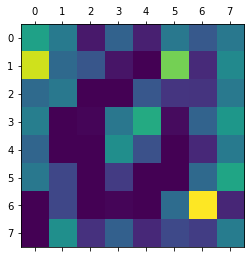

16


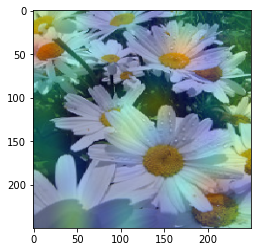

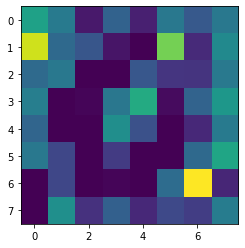

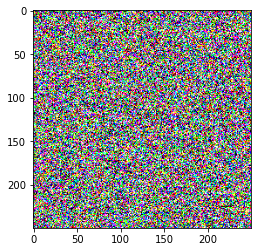

Original Class: 0 original confidence:0.9958439469337463 new class top:0 new confidence top: 0.7123033404350281 
Explainer name: grad Image number: 18 num_features 1 batch 0 number 17 strategy rest
Hitting cache, returning prev values


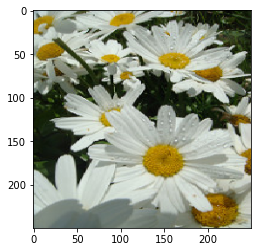

Original Class: 0 original confidence:0.9958439469337463 new class top:0 new confidence rest: 0.9958439469337463 


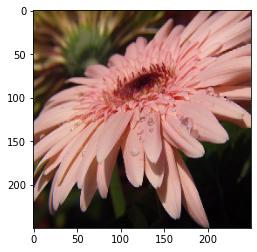

Explainer name: grad Image number: 20 num_features 1 batch 0 number 19 strategy top


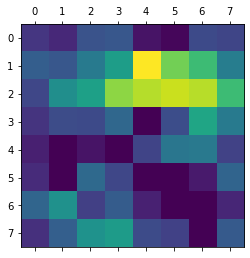

16


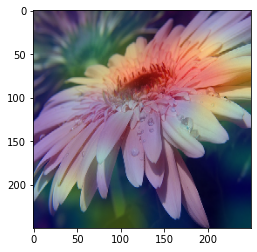

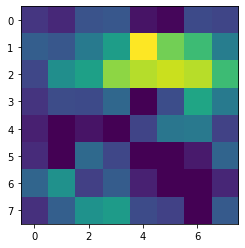

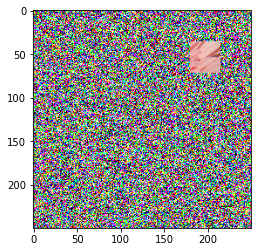

Original Class: 0 original confidence:0.9693117141723633 new class top:3 new confidence top: 0.3776223957538605 
Explainer name: grad Image number: 20 num_features 1 batch 0 number 19 strategy rest
Hitting cache, returning prev values


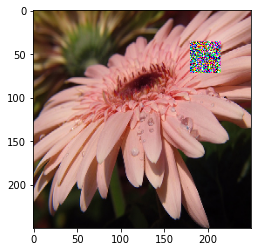

Original Class: 0 original confidence:0.9693117141723633 new class top:0 new confidence rest: 0.9845513701438904 


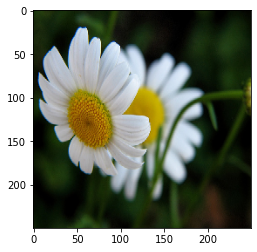

Explainer name: grad Image number: 21 num_features 1 batch 0 number 20 strategy top


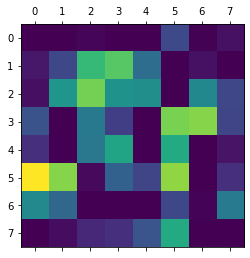

16


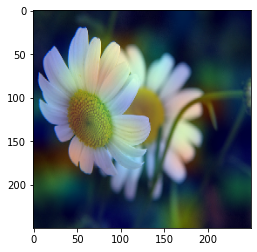

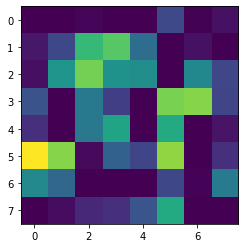

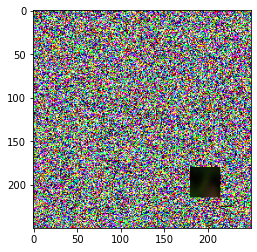

Original Class: 0 original confidence:0.9982757568359375 new class top:3 new confidence top: 0.2111687809228897 
Explainer name: grad Image number: 21 num_features 1 batch 0 number 20 strategy rest
Hitting cache, returning prev values


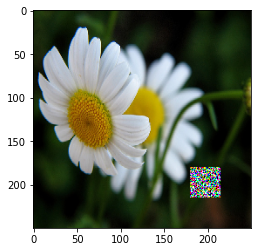

Original Class: 0 original confidence:0.9982757568359375 new class top:0 new confidence rest: 0.991609513759613 


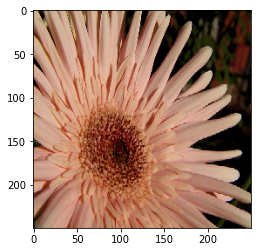

Explainer name: grad Image number: 22 num_features 1 batch 0 number 21 strategy top


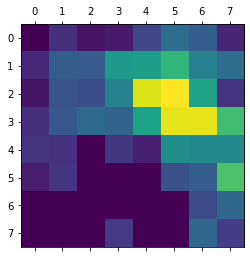

16


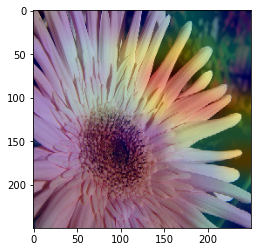

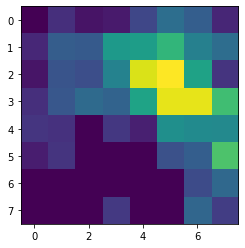

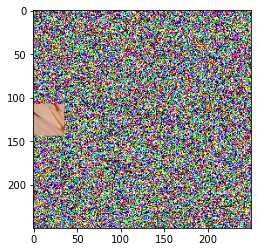

Original Class: 0 original confidence:0.886297881603241 new class top:0 new confidence top: 0.7389644384384155 
Explainer name: grad Image number: 22 num_features 1 batch 0 number 21 strategy rest
Hitting cache, returning prev values


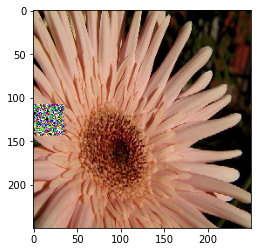

Original Class: 0 original confidence:0.886297881603241 new class top:0 new confidence rest: 0.907963752746582 


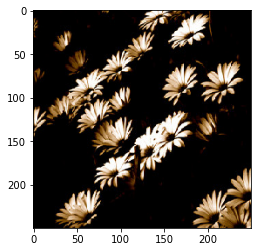

Explainer name: grad Image number: 23 num_features 1 batch 0 number 22 strategy top


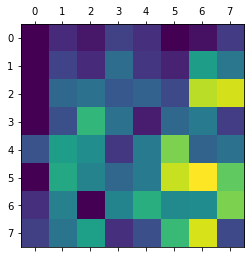

16


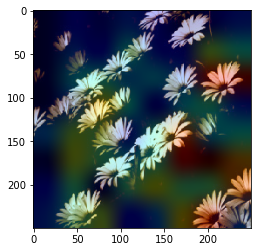

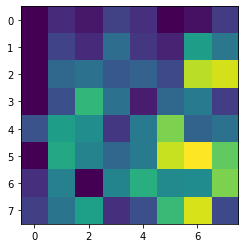

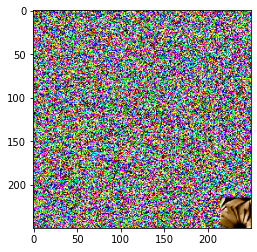

Original Class: 0 original confidence:0.9579780697822571 new class top:0 new confidence top: 0.5690150260925293 
Explainer name: grad Image number: 23 num_features 1 batch 0 number 22 strategy rest
Hitting cache, returning prev values


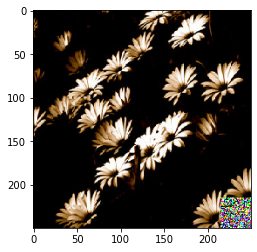

Original Class: 0 original confidence:0.9579780697822571 new class top:0 new confidence rest: 0.961584210395813 


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "c:\users\dan39\onedrive\desktop\dissertation\python3.8\lib\site-packages\IPython\core\interactiveshell.py", line 3343, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-854e61feb4b6>", line 256, in <module>
    start(explainer_name, list(range(1,2)), verbose)
  File "<ipython-input-24-854e61feb4b6>", line 216, in start
    original_class = model.predict_classes(img.reshape(1,250,250,3))[0]
  File "c:\users\dan39\onedrive\desktop\dissertation\python3.8\lib\site-packages\tensorflow\python\util\deprecation.py", line 324, in new_func
    return func(*args, **kwargs)
  File "c:\users\dan39\onedrive\desktop\dissertation\python3.8\lib\site-packages\tensorflow\python\keras\engine\sequential.py", line 359, in predict_classes
    proba = self.predict(x, batch_size=batch_size, verbose=verbose)
  File "c:\users\dan39\onedrive\desktop\dissertation\python3.8\lib\site-packages\tensorflow\python\keras\engine\training.

TypeError: object of type 'NoneType' has no len()

In [24]:
# make a color map
# reload(grad)

from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image



colors = []
for l in np.linspace(1,0,100):
    colors.append((0,0,0,l))
for l in np.linspace(0,1,100):
    colors.append((0,0,0,l))
cm = LinearSegmentedColormap.from_list("shap", colors)

def convert_to_shap_values(heatmap, verbose = 0):
    plt.matshow(heatmap)
    plt.axis('off')
    plt.margins(0,0)
    # cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
    # cb.outline.set_visible(False)
    plt.margins(0,0)
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    plt.savefig("heatmap.png", bbox_inches = 'tight',pad_inches = 0)
    plt.close()
#     img = image.load_img("heatmap.png", target_size=(7, 7, 1))
    
    fname = 'heatmap.png'
    image = Image.open(fname).convert("L")
    image.thumbnail((7,7))
    arr = np.asarray(image)
    if verbose:
        plt.imshow(arr, vmin=0, vmax=255)
        plt.show()
#     print(arr)
    
    shap_values = []
    for i in range (5):
            shap_values.append([[item for sublist in arr for item in sublist]])
    shap_values = np.array(shap_values)
    shap_values = shap_values/np.max(shap_values)
#     print(shap_values)
    return shap_values

def extract_top_ten(shap_values, num_features=10):
    new_shap_values=[]
    for values in shap_values:
        shap_list = list(set([item for sublist in values for item in sublist]))
        shap_list.sort(reverse=True)
        shap_list = shap_list[:num_features]
        new_values = [numpy.asarray([1 if a in shap_list else 0 for a in l]) for l in values] # filter out negative values and keep top 10
        new_shap_values.append(new_values)
    shap_values = numpy.asarray(new_shap_values)
    return shap_values

def init_csv(explainer_name):
    model_name = "flowers"
    newrows_filename =  "{}_{}_rows.csv".format(model_name, explainer_name, model_name)
#     newrows_filename =  "{}-values.csv".format(model_name)
    if os.path.exists(newrows_filename):
        os.remove(newrows_filename)

    with open(newrows_filename, 'a', newline='') as fd:
        writer = csv.writer(fd)
        header = ["original_class", "original_probability", "new_probability",
                  "confidence_diff","class_change", "new_class",
                  "explainer","strategy", "sigma", "time", "num_features"]
        writer.writerow(header)

def save_row(original_class, original_probability, new_probability, confidence_diff ,class_change, new_class, explainer,strategy, sigma, time, num_features):
    model_name = "flowers"
    fileName =  "{}_{}_rows.csv".format(model_name, explainer, model_name)
#     fileName =  "{}-values.csv".format(model_name)
    with open(fileName, 'a', newline='') as fd:
        writer = csv.writer(fd)
        result = [original_class, original_probability, new_probability, confidence_diff,class_change, new_class, explainer,strategy, sigma, time, num_features]
        writer.writerow(result)
        
# def fill_segmentation(values, segmentation, keep_top):
#         out = np.zeros((segmentation.shape))
#         for i in range(len(values)):
#             if keep_top:
#                 out[segmentation == i] = 0 if values[i]> 0 else 1
#             else:
#                 out[segmentation == i] = 1 if values[i]> 0 else 0
#         return out

    # define a function that depends on a binary mask representing if an image region is hidden
def mask_image(zs, segmentation, image, background=None):
    if background is None:
        background = image.mean((0,1))
    out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
    for i in range(zs.shape[0]):
        out[i,:,:,:] = image
        for j in range(zs.shape[1]):
            if zs[i,j] == 0:
                out[i][segmentation == j,:] = background
    return out

def mask_image_with_noise(zs, segmentation, image, sigma):
    out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
    mask= np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
    for i in range(zs.shape[0]):
        out[i,:,:,:] = image
        mask[i,:,:,:] = random_noise(image, mode='s&p', seed=42, amount=1)#, var=sigma**2) # tf.keras.preprocessing.image.img_to_array(random_noise(image))
        for j in range(zs.shape[1]):
            if zs[i,j] == 0:
                out[i][segmentation == j,:] = mask[i][segmentation == j,:]
    return out

prev_shap_values=None
prev_img_orig =None
prev_explanation = None
def calculate_predictions(img_orig, original_class, explainer_name, num_features, strategy, sigma, verbose = 0):
    # segment the image so we don't have to explain every pixel
    segments_slic = slic(img_orig, n_segments=49, compactness=1000, sigma=3)
   
    def f(z):
        return model.predict(mask_image(z, segments_slic, img_orig, 255))
    
    new_class_lime = None
    new_prediction_lime = None
    global prev_shap_values
    global prev_img_orig
    global prev_explanation
    if ((explainer_name =='shap' or explainer_name =='random' or explainer_name =='grad') & (img_orig == prev_img_orig).all()):
        print ("Hitting cache, returning prev values")
        shap_values = prev_shap_values
    elif explainer_name =='shap':
        # use Kernel SHAP to explain the network's predictions
        explainer = shap.KernelExplainer(f, np.zeros((1,49)))
        shap_values = explainer.shap_values(np.ones((1,49)), nsamples=1000) # runs model 1000 times
    elif explainer_name =='grad':
        # use Kernel SHAP to explain the network's predictions
        last_conv_layer_name = "conv2d"
        classifier_layer_names = [            "global_average_pooling2d",            "dense_1",        ]
#         last_conv_layer_name = "conv2d_2"
#         classifier_layer_names = [            "global_average_pooling2d_2",            "dense_5",        ]
        
        heatmap = grad.make_gradcam_heatmap(img_orig.reshape(1,250, 250, 3), model, last_conv_layer_name, classifier_layer_names)
        
        if verbose:
            grad.test_drive_grad_original(img_orig)
            plt.imshow(heatmap)
            plt.show()
            
        shap_values = []
        for i in range(5):
            shap_values.append([[item for sublist in heatmap for item in sublist]])
        shap_values = np.array(shap_values)
        shap_values = shap_values / np.max(shap_values)
        
    elif explainer_name =='random':
        shap_values =[numpy.asarray([[random.uniform(0,1)  for iter in range(50)]]) for i in range(5)]
    elif explainer_name == 'lime':
        if ((img_orig == prev_img_orig).all()):
            explanation = prev_explanation
            print ("Hitting LIME cache, returning prev values")
        else :
            explainer = lime_image.LimeImageExplainer()
            explanation = explainer.explain_instance(img_orig.astype("double"), model.predict, num_samples = 1000)
            prev_explanation = explanation
            prev_img_orig =img_orig
        
        if strategy == "top":
            lime_img, _ = explanation.get_image_and_mask(explanation.top_labels[original_class] , positive_only=True, negative_only=False, hide_rest=True, num_features = num_features, min_weight=0)
        else:
            lime_img, _ = explanation.get_image_and_mask(explanation.top_labels[original_class], positive_only=False, negative_only=True, num_features=1000, hide_rest=True)
        
        if verbose :
            plt.matshow(lime_img)
            plt.show()
        
        new_class_lime = model.predict_classes(lime_img.reshape(1,250,250,3))[0]
        new_prediction_lime = model.predict(lime_img.reshape(1,250,250,3))[0][original_class]
        
        _, mask = explanation.get_image_and_mask(explanation.top_labels[original_class] , positive_only=True, negative_only=False, hide_rest=True, num_features = num_features, min_weight=0)
        shap_values = convert_to_shap_values(mask, verbose)
        
    prev_shap_values=shap_values.copy()
    prev_img_orig =img_orig.copy()
    # get the top predictions from the model
    preds = model.predict(np.expand_dims(img_orig.copy(), axis=0))
    top_preds = np.argsort(-preds)
    inds = top_preds[0]

#     show_cut_image(shap_values, img_orig, 20)
    
    shap_values = [np.where(a<0, 0, a) for a in shap_values]
    shap_values = extract_top_ten(shap_values, num_features)
    
    if strategy == 'rest':
        shap_values = (shap_values - 1) * -1
    
    masked_image = mask_image_with_noise(shap_values[inds[0]], segments_slic, img_orig, sigma)
    
    if verbose:
        plt.imshow(masked_image[0])
        plt.show()
    
    new_class  = model.predict_classes(masked_image)[0]
    new_prediction = model.predict(masked_image)[0][original_class]
    return new_class, new_prediction, new_class_lime, new_prediction_lime
    

def start(explainer_name, num_features_list, verbose = 0):
    counter = 0
    for i in range(len(test_image_gen)):
        batch = test_image_gen[i]
        for j in range(len(batch[0])):
            counter = counter + 1
            img = batch[0][j]
            original_class = model.predict_classes(img.reshape(1,250,250,3))[0]
            original_confidence = model.predict(img.reshape(1,250,250,3))[0][original_class]
            if original_class == np.argmax(batch[1][j]):
                if verbose:
                    plt.imshow((img))
                    plt.show()
                    plt.close()
                for num_features in num_features_list:
                    for strategy in ["top", "rest"]:
                        for sigma in [1]:
                            if explainer_name == 'lime':
                                print ("Explainer name: {} Image number: {} num_features {} batch {} number {} strategy {}".format(explainer_name, counter, num_features, i, j, strategy))
                                start_time = time.time()
                                new_class, new_prediction, new_class_lime, new_prediction_lime = calculate_predictions(img, original_class, explainer_name, num_features, strategy, sigma, verbose)
                                total_time = time.time() - start_time
                                print ("Lime Standard Original Class: {} original confidence:{} new class top:{} new confidence {}: {} "
                                       .format(original_class, original_confidence, new_class, strategy, new_prediction) )

                                print ("Lime Original: Original Class: {} original confidence:{} new class top:{} new confidence {}: {} "
                                       .format(original_class, original_confidence, new_class_lime, strategy, new_prediction_lime) )

                                save_row(original_class, original_confidence, new_prediction,original_confidence - new_prediction ,original_class != new_class, new_class, "lime-standard", strategy, sigma, total_time, num_features)
                                save_row(original_class, original_confidence, new_prediction_lime,original_confidence - new_prediction_lime ,original_class != new_class_lime, new_class_lime, "lime", strategy, sigma, total_time, num_features)
                            else:
                                print ("Explainer name: {} Image number: {} num_features {} batch {} number {} strategy {}".format(explainer_name, counter, num_features, i, j, strategy))
                                start_time = time.time()
                                new_class, new_prediction, _, _ = calculate_predictions(img, original_class, explainer_name, num_features, strategy, sigma, verbose)
                                total_time = time.time() - start_time
                                print ("Original Class: {} original confidence:{} new class top:{} new confidence {}: {} "
                                       .format(original_class, original_confidence, new_class, strategy, new_prediction) )

                                save_row(original_class, original_confidence, new_prediction,original_confidence - new_prediction ,original_class != new_class, new_class, explainer_name, strategy, sigma, total_time, num_features)

verbose= 1
for explainer_name in ["grad"]:
# for explainer_name in [sys.argv[1]]:
    if explainer_name == "lime":
        init_csv("lime-standard")
        
    init_csv(explainer_name)
    start(explainer_name, list(range(1,2)), verbose)


In [ ]:
model.summary()